# **DSI Capstone Project: CNN Furniture Image Classifier**


# Background
Carousell is a Singaporean company in the smartphone and web-based consumer to consumer and business to consumer marketplace for buying and selling secondhand goods. They operate in Singapore, Malaysia, Philippines, Cambodia, Taiwan, Hong Kong, Macau, Australia, New Zealand and Canada.

As of 2016, over 23 million items have been sold on the platform and has a total listing of over 57 million items, both used and new. Carousell has also successfully received mulitple rounds of investments from multiple investors, which are all indicators of a fast growing firm that heavily relies on their consumers and the experiences they gain from using their platform.


[Information from Wiki] :https://en.wikipedia.org/wiki/Carousell_(company)#History



# Problem Statment

The recent increase in listings of items on our Carousell platform due to the pandemic, has highlighted certain pain points faced by our consumers. The team at Carousell have been noticing an increase in sellers postings and listing items in the wrong categories to increase their listings exposure in the hopes of increasing their chances of making a successful sale. While most wrongly classified listings are usually closely related, This would still negatively affect consumers' user experiences as they are unable to effectively shop and search for specific items due to the “noise” wrongly classified listings. This is a major problem as the company’s main focus is providing a platform that matches sellers to buyers, if the process for either party isn’t smooth and efficient, this may lead to a decrease in users on both ends. Hence, this issue of wrongly classified postings has to be dealt with efficiently and effectively. 
 
As such, the Data Team has been tasked to develop possible methods to help minimise such incidents from happening on the platform. The team has decide to conduct a pilot test to examine if **Deep learning Convolutionary Neural Network(CNN) Image Classification Model** could be one of the methods deployed to combat the misclassification of listings. The model will be evaluated on its confusion matrix and the calculations that come out of it**(accuracy, sensitivity, specificity and precision)**.
 
As there is no particle importance in which class(furniture item) is more important than the other, **accuracy scores will be our main focus** in determining which model is the best performer. If the model was deemed to be a success, it could be systematically deployed across the different categories to combat the issue of incorrect listings.






# Data

The data for a CNN model comes in the form of images in both jpg and jpeg formats. As images were scrapped using a google extension where the sizes(height,width) can be filtered, there will not be a need to check if there are any outliers in terms of size. Table and bed are meant for training the CNN model, while REAL_POSTS_table and REAL_POST_bed are images directly from Carousell's recent listings and will be used to check the accuracy of the best CNN model.
 
 
The data comes in 1 folder with 4 subfolders:
 
    1.Table

        -Approximately 1200 images of tables.
        -Different backgrounds(White and fully furnished settings).
        -Shapes/Material(Round, rectangular, square, wooden, glass, mat and gloss finish).
 
    2.Bed

        -Approximately 1200 images of beds.
        -Different backgrounds(White and fully furnished settings).
        -Size/Material(Queen, Single and bed frames).

    3.REAL_POSTS_table

        -3 images of tables.
        -Different backgrounds(White and fully furnished settings).
        -Shapes/Material(Rounded oval shape, rectangular and wooden).

    4.REAL_POSTS_bed

        -3 images of beds.
        -Different backgrounds(fully furnished settings and low lighting settings).
        -Size/Material(Queen, Single, bed frames).

    5.Weights

        -Weights saved from the best model. 

In [28]:
import os # accessing directory structure
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import glob
import tensorflow as tf
import itertools

from IPython.display import Image
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Sequential,Model,load_model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras import utils
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions


# Pre-Processing 

The goal of this section would be to process the jpeg and jpg files into a formatted numpy array ready to be fed into the CNN models. With the main flow being as such:

	1.Creating a list of paths of each image
	2.Creating a main dataframe of all images
	3.Reading each path and converting them into numpy array
	4.Resizing and rescaling(colour)
	5.Train Test Split
	6.Reshaping arrays of both X and y to resemble
        -X:(No. Of images, width, height, RGB)
		-y:(No. Of images,labels)


In [2]:
#  mounting drive to access datasets

# from google.colab import drive
# drive.mount('/content/drive')

The cell above has been commented out as it was done on google colab. 

In [3]:
#Creating a list of paths of each image

# bed_jpeg=glob.glob('/content/drive/My Drive/data/bed/*.jpeg')
# bed_jpg=glob.glob('/content/drive/My Drive/data/bed/*.jpg')

# bed=bed_jpeg+bed_jpg
# table= glob.glob('/content/drive/My Drive/data/Table/*.jpg')

#The lines of code above has been commented out as it was done on google colab. 


bed_jpeg=glob.glob('../data/bed/*.jpeg')
bed_jpg=glob.glob('../data/bed/*.jpg')

bed=bed_jpeg+bed_jpg

table= glob.glob('../data/table/*.jpg')


In [13]:
bed[0:5]

['../data/bed/373.jpeg',
 '../data/bed/236.jpeg',
 '../data/bed/324.jpeg',
 '../data/bed/261.jpeg',
 '../data/bed/148.jpeg']

In [14]:
table[0:5]

['../data/table/table1128.jpg',
 '../data/table/table797.jpg',
 '../data/table/table783.jpg',
 '../data/table/table973.jpg',
 '../data/table/table1114.jpg']

In [15]:
#changing into dataframe
table_df=pd.DataFrame(table,columns=["filename"])
bed_df=pd.DataFrame(bed,columns=["filename"])


In [16]:
table_df.head()

,filename
0,../data/table/table1128.jpg
1,../data/table/table797.jpg
2,../data/table/table783.jpg
3,../data/table/table973.jpg
4,../data/table/table1114.jpg


In [17]:
bed_df.head()

,filename
0,../data/bed/373.jpeg
1,../data/bed/236.jpeg
2,../data/bed/324.jpeg
3,../data/bed/261.jpeg
4,../data/bed/148.jpeg


In [18]:
#adding classification labels to both dataframes
bed_df["class"]=0
table_df["class"]=1

In [19]:
#combining both table and bed dataframes
df= pd.concat([table_df,bed_df])
df.head()

,filename,class
0,../data/table/table1128.jpg,1
1,../data/table/table797.jpg,1
2,../data/table/table783.jpg,1
3,../data/table/table973.jpg,1
4,../data/table/table1114.jpg,1


In [21]:
df.tail()

,filename,class
1132,../data/bed/so1045.jpg,0
1133,../data/bed/so475.jpg,0
1134,../data/bed/so1051.jpg,0
1135,../data/bed/so1086.jpg,0
1136,../data/bed/so1092.jpg,0


In [22]:
def file_to_img(filename):
  '''Function that reads, rescales and resizes images'''
  img=(cv2.imread(filename)/255)
  img=cv2.resize(img,(224,224))
  return img

In [23]:
#applying function to read, rescale and resize all images in dataframe
df["img"]=df["filename"].apply(lambda x: file_to_img(x))
df.head()

,filename,class,img
0,../data/table/table1128.jpg,1,"[[[0.4795518207282913, 0.48739495798319327, 0...."
1,../data/table/table797.jpg,1,"[[[0.9294117647058824, 0.9215686274509803, 0.9..."
2,../data/table/table783.jpg,1,"[[[0.9098039215686274, 0.9098039215686274, 0.9..."
3,../data/table/table973.jpg,1,"[[[0.6748161764705882, 0.6552083333333334, 0.6..."
4,../data/table/table1114.jpg,1,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,..."


In [24]:
df.tail()

,filename,class,img
1132,../data/bed/so1045.jpg,0,"[[[0.6549019607843137, 0.6745098039215687, 0.6..."
1133,../data/bed/so475.jpg,0,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,..."
1134,../data/bed/so1051.jpg,0,"[[[0.8235294117647058, 0.8431372549019608, 0.8..."
1135,../data/bed/so1086.jpg,0,"[[[0.9725490196078431, 0.9725490196078431, 0.9..."
1136,../data/bed/so1092.jpg,0,"[[[0.6509803921568628, 0.796078431372549, 0.78..."


In [25]:
def plt_img_df(df,figsize):
  '''Function that plots out all image arrays in a dataframe'''
  #sets the number of rows needed
  nrows=round(len(df)/5)
  fig, ax = plt.subplots(nrows=nrows,ncols=5,figsize=figsize)
  plt.gray()
  ax=ax.ravel()
  img_arr_list=list(df["img"])
  plt.subplots_adjust(hspace=0.05, wspace=0.3)

  for i,img in enumerate(img_arr_list):
    ax[i].imshow(img)
    ax[i].axis("off")

In [27]:
X=df[["img"]]
y=df["class"]
#Train Test Split
#y_val_cm as confusion metrics only accepts in this format 
X_train, X_val ,y_train, y_val_cm = train_test_split(X,y,stratify=y,random_state=40,test_size=0.3)

In [28]:
#baseline model
baseline_model=y.value_counts(normalize=True)
baseline_model

1    0.519848
0    0.480152
Name: class, dtype: float64

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

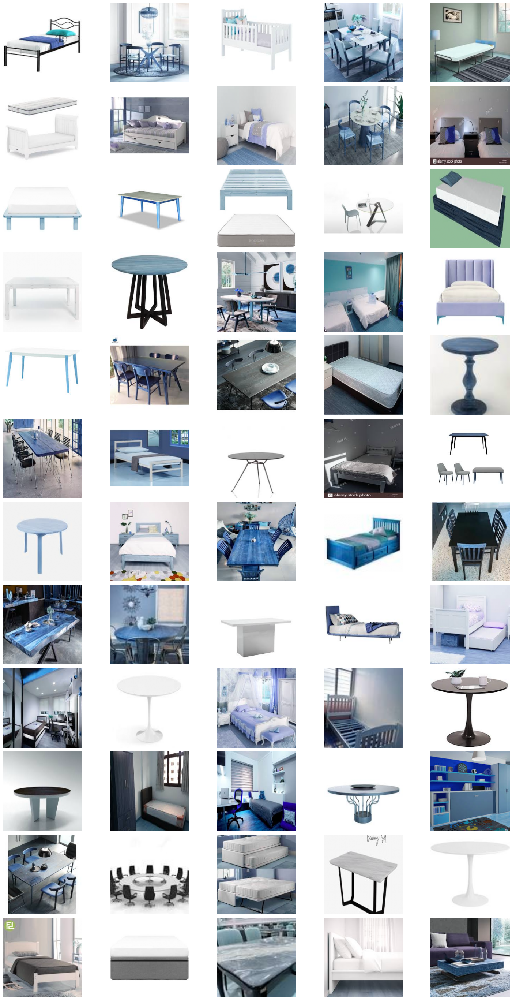

In [426]:
plt_img_df(X_train.head(60),(25,50))

In [164]:
X_val.shape

(711, 1)

In [163]:
X_train.shape

(1658, 1)

In [165]:
y_train.shape

(1658, 2)

In [166]:
y_val_cm.shape

(711,)

In [15]:
#Changes labels into catergories, acts like a form of one-hot encoding which is needed
#for CNN predictions and model evaluation. 
y_train = utils.to_categorical(y_train,2)
y_val =utils.to_categorical(y_val_cm,2)

In [167]:
y_train.shape

(1658, 2)

In [168]:
y_val.shape

(711, 2)

In [170]:
#Creating a list of labels for model evaluation 
val_labels_list = list(y_val_cm)
val_labels_list[0:3]

[0, 0, 1]

In [17]:
# Coverting X_train and X_val into a list then into an array as this format is needed 
# for CNN models to run

#Converting to list
X_train_list=list(X_train["img"])
X_val_list=list(X_val["img"])
#Converting to array
X_train_array=np.array(X_train_list)
X_val_array=np.array(X_val_list)

In [171]:
X_train_array.shape

(1658, 224, 224, 3)

In [172]:
X_val_array.shape

(711, 224, 224, 3)

# Functions


In [20]:
def acc_plt(hist,num_epoch,step):

  """Function that plots train and validation accuracy based on the number of epochs"""

  # Check out our train loss and test loss over epochs.
    train_acc = hist.history['accuracy']
    val_acc = hist.history['val_accuracy']

    # Set figure size.
    plt.figure(figsize=(12, 8))

    # Generate line plot of training, testing loss over epochs.
    plt.plot(train_acc, label='Training Accuracy', color='#185fad')
    plt.plot(val_acc, label='Validation Accuracy', color='orange')

    # Set title
    plt.title('Training and Validation Accuracy by Epoch', fontsize = 25)
    plt.xlabel('Epoch', fontsize = 18)
    plt.ylabel('Accuracy', fontsize = 18)
    plt.xticks(np.arange(0, num_epoch, step=step))
    plt.legend(fontsize = 18);

In [277]:
def train_test_loss_plt(hist,num_epoch,step):

    """Function that plots train and validation loss based on the number of epochs"""

    # Check out our train loss and test loss over epochs.
    train_loss = hist.history['loss']
    test_loss = hist.history['val_loss']

    # Set figure size.
    plt.figure(figsize=(12, 8))

    # Generate line plot of training, testing loss over epochs.
    plt.plot(train_loss, label='Training Loss', color='#185fad')
    plt.plot(test_loss, label='Validation Loss', color='orange')

    # Set title
    plt.title('Training and Validation Loss by Epoch', fontsize = 25)
    plt.xlabel('Epoch', fontsize = 18)
    plt.ylabel('Binary Crossentropy', fontsize = 18)
    plt.xticks(np.arange(0, num_epoch, step=step))

    plt.legend(fontsize = 18);

In [244]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix'):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)
    plt.figure(figsize=(16,8))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(title, fontsize=16)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True labels', fontsize=14)
    plt.xlabel('Predicted labels', fontsize=14)

  #Code referenced from  https://towardsdatascience.com/age-detection-using-facial-images-traditional-machine-learning-vs-deep-learning-2437b2feeab2

In [243]:
def cm_cal_full(cm):

  """Function that calculates accuracy, specificity, sensitivity and precsion"""

  tn,fp,fn,tp=cm.ravel()
  accu = (tp+tn) /(tp+fp+tn+fn)
  spec = tn / (tn + fp)
  sens = tp / (tp + fn)
  prec = tp / (tp + fp)
  print(f'Accuracy:{round(accu,4)}\nSpecificity: {round(spec,4)}\nSensitivity: {round(sens,4)}\nPrecision:{round(prec,4)}')


# Modeling

In this section, the goal is to find a CNN model that achieves the highest accuracy scores. Each CNN model will be finetuned with regularization, padding and amount of layers, transfer learning and data augmentation will also be explored as 1200 images per class is considered to be too small to achieve models with a higher accuracy.  VGG16 will be used as the transfer learning as it seems to be the most popular for classifying furniture. A more detailed examination of what each layer of the transferred learning CNN model will be performed to better understand what goes behind the scenes of a CNN model. 

The main workflow will be as such:

    1.Finalise Number of Layers (1, 2 or 3)
    2.Add Regularization(Dropout, L1 or L2)
    3.Implementation of Data Augmentation
    4.Implementation of Transfer learning 
    5.Model Evaluation 
 

## CNN Model without Data Augmentation

In [ ]:
#Creating CNN Model
cnn_model_7=Sequential()
cnn_model_7.add(Conv2D(filters=8,
                    kernel_size = 3,
                    activation='relu',
                    input_shape=(224,224,3)))
cnn_model_7.add(MaxPooling2D())
cnn_model_7.add(Conv2D(filters=16,
                     kernel_size=3,
                     activation='relu',
                     padding="valid"))
cnn_model_7.add(MaxPooling2D(pool_size=(2,2)))
cnn_model_7.add(Conv2D(filters=32,
                     kernel_size=3,
                     activation='relu',
                     padding="valid",))
cnn_model_7.add(MaxPooling2D(pool_size=(2,2)))
cnn_model_7.add(Conv2D(filters=64,
                     kernel_size=3,
                     activation='relu',
                     padding="valid"))
cnn_model_7.add(GlobalAveragePooling2D())
cnn_model_7.add(Dropout(0.5))
cnn_model_7.add(Dense(64, activation= 'relu'))
cnn_model_7.add(Dropout(0.5))
cnn_model_7.add(Dense(32, activation= 'relu',
                      kernel_regularizer =tf.keras.regularizers.l1( l=0.02)))
cnn_model_7.add(Dropout(0.5))
cnn_model_7.add(Dense(2,activation="sigmoid"))

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
cnn_model_7.compile(loss='binary_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])

In [ ]:
history_7=cnn_model_7.fit(X_train_array, y_train,batch_size=64,
                      validation_data=(X_val_array,y_val),
                      epochs=200, verbose=1)

Epoch 1/200
26/26 [==============================] - 1s 38ms/step - loss: 5.4148 - accuracy: 0.5133 - val_loss: 4.8987 - val_accuracy: 0.5190
Epoch 2/200
26/26 [==============================] - 1s 27ms/step - loss: 4.4616 - accuracy: 0.5181 - val_loss: 3.9995 - val_accuracy: 0.5190
Epoch 3/200
26/26 [==============================] - 1s 27ms/step - loss: 3.6055 - accuracy: 0.5247 - val_loss: 3.1887 - val_accuracy: 0.5471
Epoch 4/200
26/26 [==============================] - 1s 27ms/step - loss: 2.8563 - accuracy: 0.5730 - val_loss: 2.4914 - val_accuracy: 0.6287
Epoch 5/200
26/26 [==============================] - 1s 28ms/step - loss: 2.2143 - accuracy: 0.6098 - val_loss: 1.9000 - val_accuracy: 0.6245
Epoch 6/200
26/26 [==============================] - 1s 28ms/step - loss: 1.6767 - accuracy: 0.6194 - val_loss: 1.4283 - val_accuracy: 0.6751
Epoch 7/200
26/26 [==============================] - 1s 27ms/step - loss: 1.2550 - accuracy: 0.6514 - val_loss: 1.0531 - val_accuracy: 0.6498
Epoch 

In [ ]:
cnn_model_7.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 222, 222, 8)       224       
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 111, 111, 8)       0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 109, 109, 16)      1168      
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 54, 54, 16)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 52, 52, 32)        4640      
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 26, 26, 32)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 24, 24, 64)       

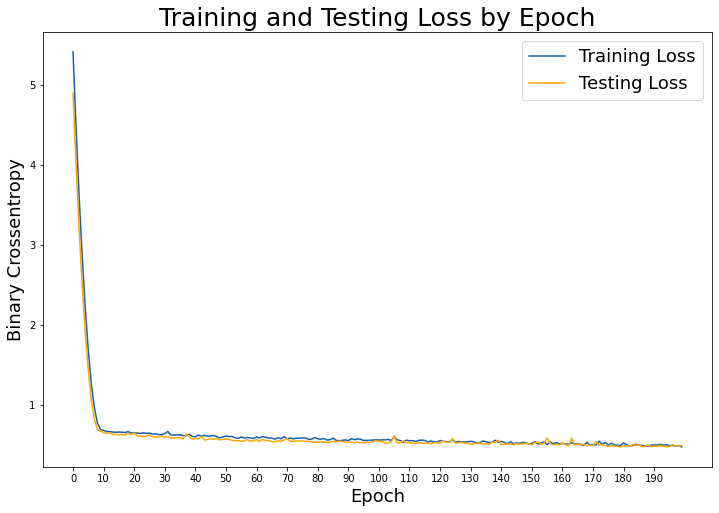

In [ ]:
train_test_loss_plt(history_7,200,10)



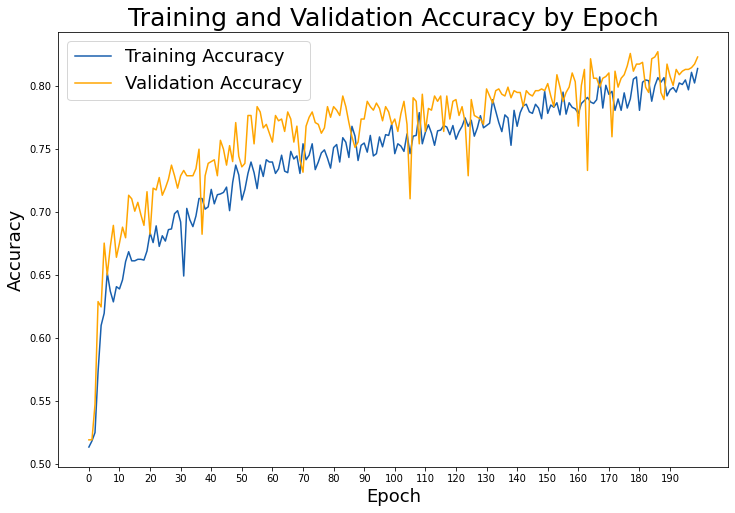

In [ ]:
acc_plt(history_7,200,10)


Both accuracy and loss plots start to converge at around 200 epoch, reaching a train loss of about 0.47, validation loss of about 0.49, training accuracy of about 0.81 and validation accuracy of about 0.82.
This shows that the model is well fitted as it is able to predict the validation dataset and the training dataset with the same accuracy.

In [ ]:
#Predicting on X_val
cnn_7_preds= cnn_model_7.predict(X_val_array)
cnn_7_preds = cnn_7_preds.argmax(axis=-1)

Confusion matrix, without normalization


<Figure size 1152x576 with 0 Axes>

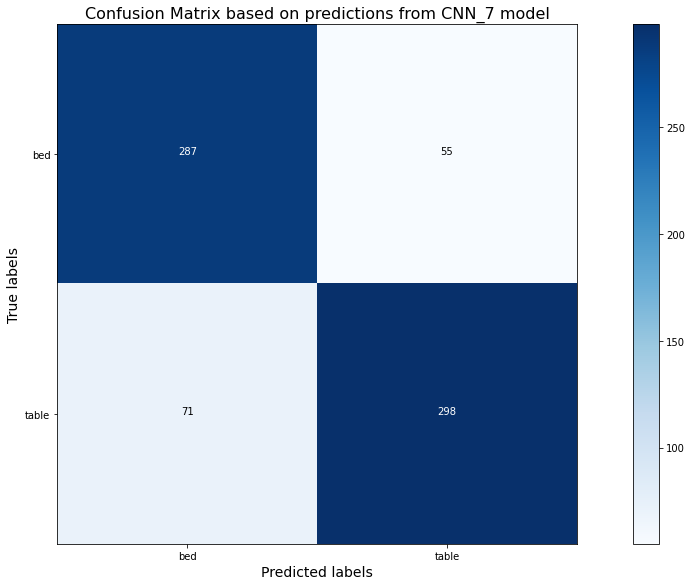

In [ ]:
#Creating and ploting Confusion matrix
cm_plot_labels = pd.Series(["bed","table"])

cm_7 = confusion_matrix(val_labels_list, cnn_7_preds)

plot_confusion_matrix(cm_7, cm_plot_labels, normalize=False,
                      title="Confusion Matrix based on predictions from CNN_7 model")

In [ ]:
print("MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES")
print("--------------"*4)
cm_cal_full(cm_7)

MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES
--------------------------------------------------------
Accuracy:0.8228
Specificity: 0.8392
Sensitivity: 0.8076
Precision:0.8442


From the Confusion Matrix, the specificity and the sensitivity scores are about the same. Showing that misclassification of both items are happening almost equally. 


In [ ]:
#Creating Dataframe to identify wrongly classified images
pred_df_m7=pd.DataFrame(y_val_cm)
pred_df_m7["prediction"]=cnn_7_preds
pred_df_m7["img"]=X_val["img"]

In [ ]:
pred_df_m7.head(10)

,class,prediction,img
405,0,0,"[[[0.9843137254901959, 0.9725490196078432, 0.9..."
922,0,0,"[[[0.7810481944718484, 0.7654056481229798, 0.7..."
659,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
751,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
311,0,0,"[[[0.34509803921568627, 0.40784313725490196, 0..."
69,0,0,"[[[1.0000000298023224, 1.0000000298023224, 1.0..."
690,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
741,0,0,"[[[1.000000026077032, 1.000000026077032, 1.000..."
806,1,1,"[[[0.7118259803921569, 0.8735294117647059, 0.9..."
1072,1,1,"[[[0.7647233829930837, 0.7490371082130136, 0.6..."


In [ ]:
#Filtering out wrongly classified images
pred_summary_m7=pred_df_m7.loc[pred_df_m7['class']!=pred_df_m7['prediction'],:].sort_values("class",ascending=False)[['class','prediction','img']]
pred_summary_m7

,class,prediction,img
659,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
1138,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
922,1,0,"[[[0.43854166666666666, 0.5326593137254901, 0...."
764,1,0,"[[[0.98039217375438, 0.98039217375438, 0.98039..."
634,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
...,...,...,...
1032,0,1,"[[[0.11809348913968779, 0.1808385881138783, 0...."
178,0,1,"[[[0.8078431191982008, 0.8078431191982008, 0.8..."
857,0,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
24,0,1,"[[[0.9999999850988388, 0.9999999850988388, 0.9..."


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

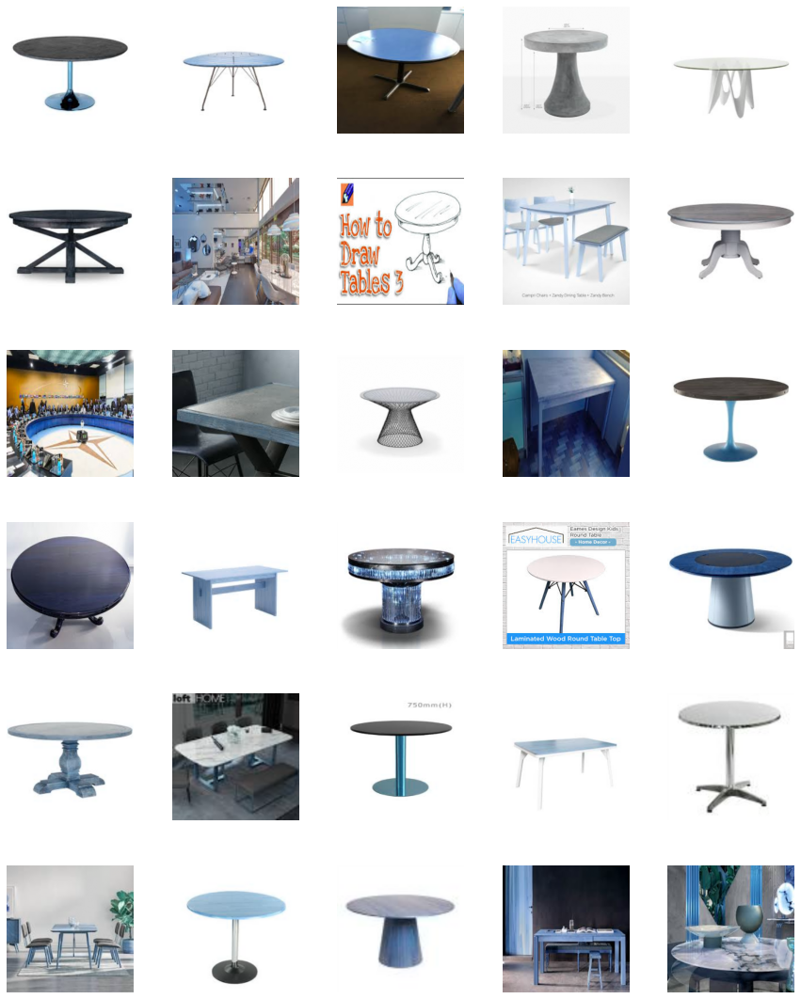

In [291]:
#Showing top 30 wrongly classified posts
plt_img_df(pred_summary_m7.head(30),(15,20));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


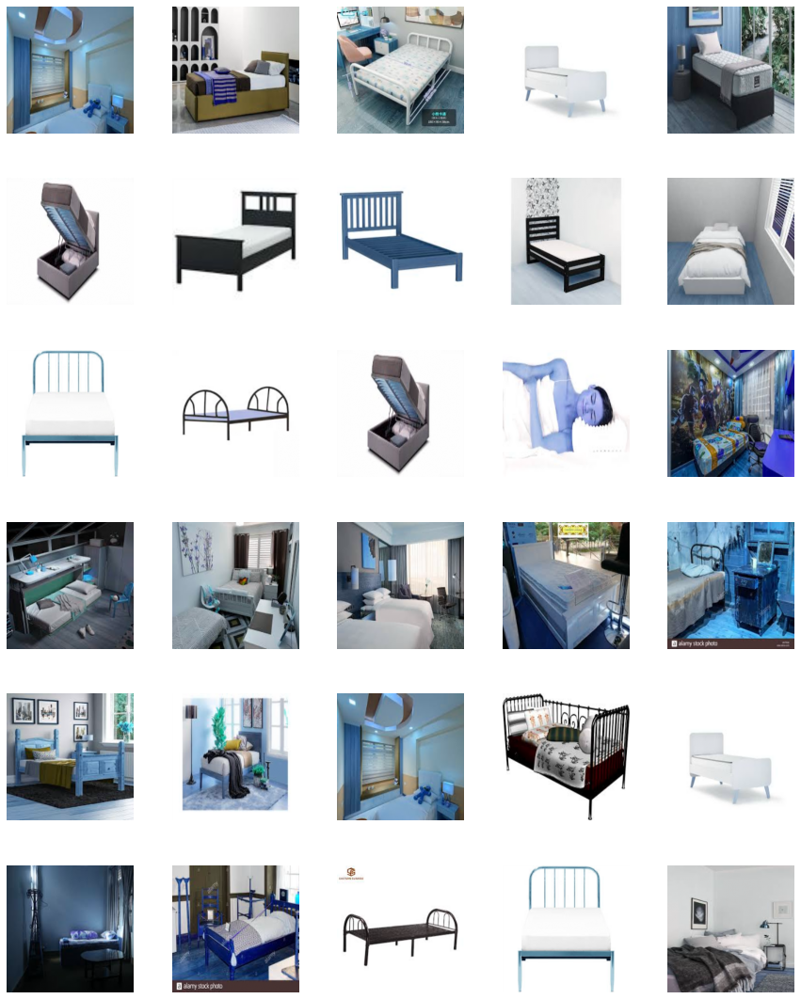

In [292]:
#Showing bottom 30 wrongly classified posts
plt_img_df(pred_summary_m7.tail(30),(15,20));

Possible reasons why the model is not able to predict these images correctly:

    1.The model isn't able to correctly identify and learn what round tables look like, 
    hence most of the tables that are not classified correctly are round tables.

    2.They contain both items from both catergories. (or items that look similiar)

    3.Many of bed images are actually the frames of beds, and are mistaken as tables.

    4.They are totally random and unrelated to either items

## CNN Model with Data Augmentation


In [76]:
#Setting the different parameters that would augment images
datagen= ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range= 0.2 ,
    horizontal_flip=True,
    fill_mode="nearest")

In [77]:
#Fitting datagen to X_train data
datagen.fit(X_train_array)

In [273]:
#Creating CNN model 
cnn_model_5=Sequential()
cnn_model_5.add(Conv2D(filters=8,
                    kernel_size = 3,
                    activation='relu',
                    input_shape=(224,224,3)))
cnn_model_5.add(MaxPooling2D())
cnn_model_5.add(Conv2D(filters=16,
                     kernel_size=3,
                     activation='relu',
                     padding="valid"))
cnn_model_5.add(MaxPooling2D(pool_size=(2,2)))
cnn_model_5.add(Conv2D(filters=32,
                     kernel_size=3,
                     activation='relu',
                     padding="valid",))
cnn_model_5.add(MaxPooling2D(pool_size=(2,2)))
cnn_model_5.add(Conv2D(filters=64,
                     kernel_size=3,
                     activation='relu',
                     padding="valid"))
cnn_model_5.add(GlobalAveragePooling2D())
cnn_model_5.add(Dropout(0.5))
cnn_model_5.add(Dense(64, activation= 'relu'))
cnn_model_5.add(Dropout(0.5))
cnn_model_5.add(Dense(32, activation= 'relu',
                      kernel_regularizer =tf.keras.regularizers.l1( l=0.02)))
cnn_model_5.add(Dropout(0.5))
cnn_model_5.add(Dense(2,activation="sigmoid"))

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
cnn_model_5.compile(loss='binary_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])

In [274]:
cnn_model_5.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_24 (Conv2D)           (None, 222, 222, 8)       224       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 111, 111, 8)       0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 109, 109, 16)      1168      
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 54, 54, 16)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 52, 52, 32)        4640      
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 26, 26, 32)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 24, 24, 64)       

In [275]:
history_5=cnn_model_5.fit(datagen.flow(X_train_array, y_train, batch_size=64),
          steps_per_epoch=len(X_train_array) / 64, epochs=300,validation_data=(X_val_array,y_val))

Epoch 1/300
26/25 [==============================] - 17s 641ms/step - loss: 5.3301 - accuracy: 0.5181 - val_loss: 4.8139 - val_accuracy: 0.5190
Epoch 2/300
26/25 [==============================] - 16s 626ms/step - loss: 4.3750 - accuracy: 0.5199 - val_loss: 3.9188 - val_accuracy: 0.5190
Epoch 3/300
26/25 [==============================] - 16s 621ms/step - loss: 3.5295 - accuracy: 0.5181 - val_loss: 3.1240 - val_accuracy: 0.5190
Epoch 4/300
26/25 [==============================] - 16s 618ms/step - loss: 2.7895 - accuracy: 0.5072 - val_loss: 2.4392 - val_accuracy: 0.5190
Epoch 5/300
26/25 [==============================] - 16s 614ms/step - loss: 2.1545 - accuracy: 0.5169 - val_loss: 1.8552 - val_accuracy: 0.5190
Epoch 6/300
26/25 [==============================] - 16s 617ms/step - loss: 1.6369 - accuracy: 0.5283 - val_loss: 1.3845 - val_accuracy: 0.5429
Epoch 7/300
26/25 [==============================] - 16s 615ms/step - loss: 1.2201 - accuracy: 0.5730 - val_loss: 1.0321 - val_accuracy:

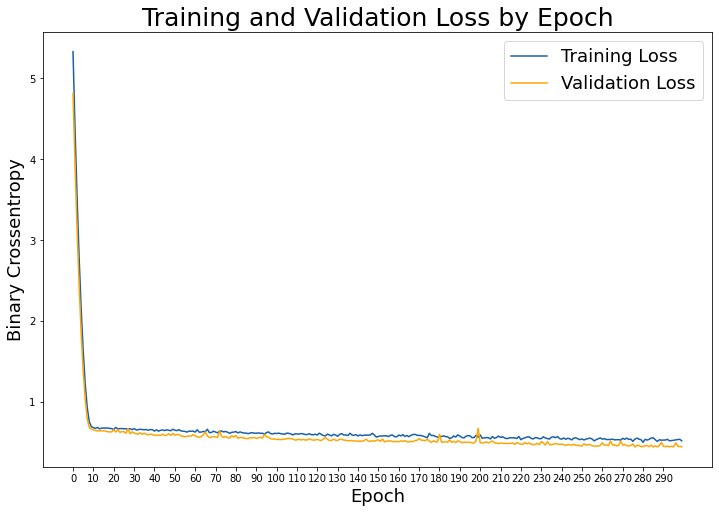

In [278]:
train_test_loss_plt(history_5,300,10)


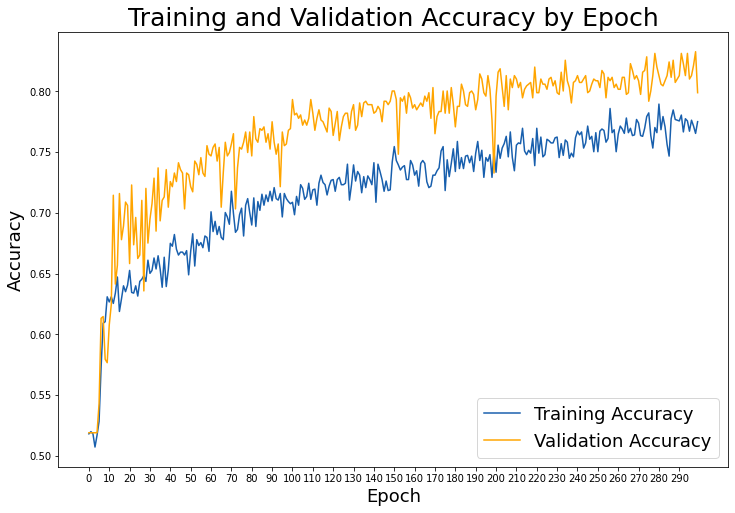

In [279]:
acc_plt(history_5,300,10)


Both accuracy and loss plots start to converge at around 270 epoch, reaching a train loss of about 0.52, validation loss of about 0.44, training accuracy of about 0.77 and validation accuracy of about 0.79.

This shows that there is a slight underfit in the model as it is able to predict the validation dataset better than the training dataset.

In [86]:
cnn_5_preds= cnn_model_5.predict(X_val_array)
cnn_5_preds = cnn_5_preds.argmax(axis=-1)

Confusion matrix, without normalization


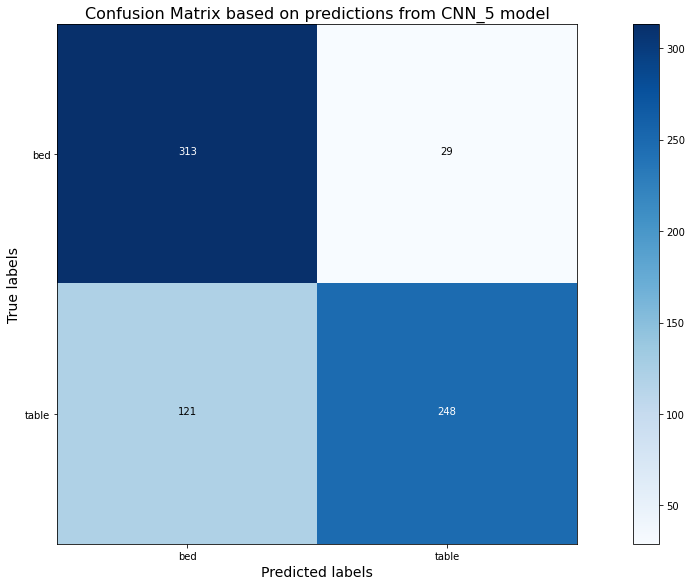

In [249]:
cm_5 = confusion_matrix(val_labels_list, cnn_5_preds)

plot_confusion_matrix(cm_5, cm_plot_labels, normalize=False,
                      title="Confusion Matrix based on predictions from CNN_5 model")

In [266]:
print("MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES")
print("--------------"*4)
cm_cal_full(cm_5)

MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES
--------------------------------------------------------
Accuracy:0.789
Specificity: 0.9152
Sensitivity: 0.6721
Precision:0.8953


This model is not able to predict tables very as compared to predicting beds, which can be seen from the specificity and sensitivity scores. Which shows suggests that the data agumentation has enabled the model to better classify beds than tables.


In [89]:
pred_df_m5=pd.DataFrame(y_val_cm)
pred_df_m5["prediction"]=cnn_5_preds
pred_df_m5["img"]=X_val["img"]

In [90]:
pred_df_m5.head(10)

,class,prediction,img
405,0,0,"[[[0.9843137254901959, 0.9725490196078432, 0.9..."
922,0,0,"[[[0.7810481944718484, 0.7654056481229798, 0.7..."
659,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
751,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
311,0,0,"[[[0.34509803921568627, 0.40784313725490196, 0..."
69,0,1,"[[[1.0000000298023224, 1.0000000298023224, 1.0..."
690,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
741,0,0,"[[[1.000000026077032, 1.000000026077032, 1.000..."
806,1,1,"[[[0.7118259803921569, 0.8735294117647059, 0.9..."
1072,1,1,"[[[0.7647233829930837, 0.7490371082130136, 0.6..."


In [91]:
pred_summary_m5=pred_df_m5.loc[pred_df_m5['class']!=pred_df_m5['prediction'],:].sort_values("class",ascending=False)[['class','prediction','img']]
pred_summary_m5

,class,prediction,img
659,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
1198,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
360,1,0,"[[[1.0000000149011612, 0.9960784462152743, 0.9..."
1135,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
461,1,0,"[[[1.0000000223517418, 1.0000000223517418, 1.0..."
...,...,...,...
443,0,1,"[[[0.9882353088435005, 0.9960784462152743, 0.9..."
634,0,1,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,..."
1078,0,1,"[[[0.9921568535049172, 0.9999999906867743, 0.9..."
32,0,1,"[[[0.01175595258318528, 0.01959908997322032, 0..."


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

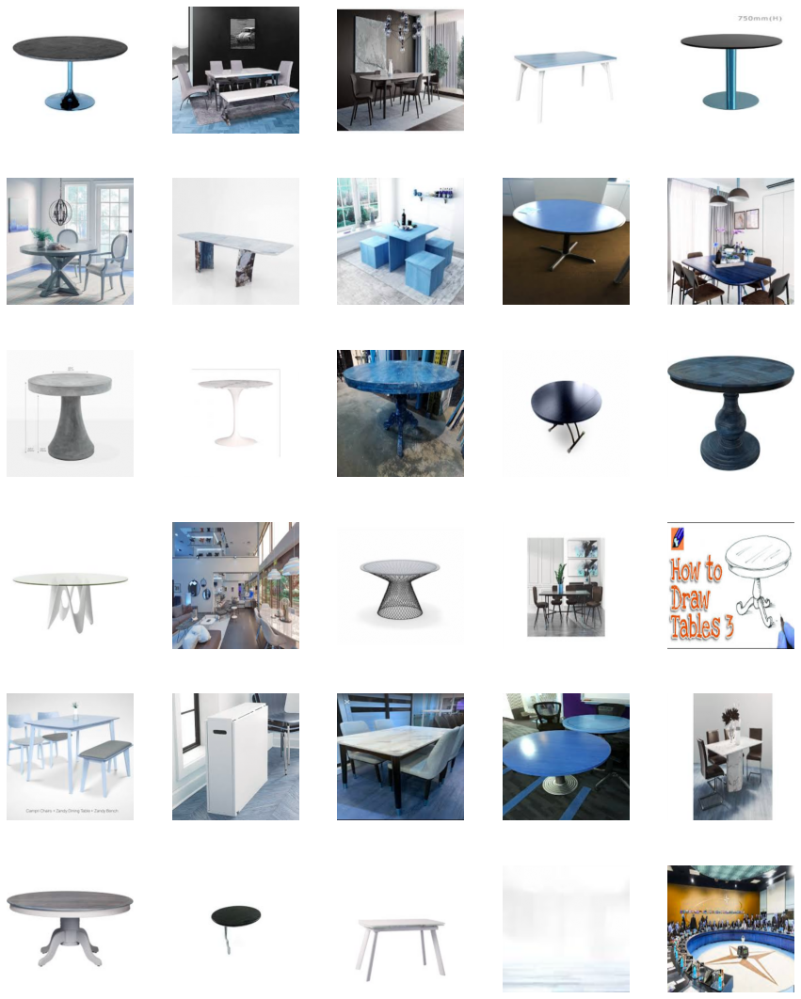

In [293]:
plt_img_df(pred_summary_m5.head(30),(15,20));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


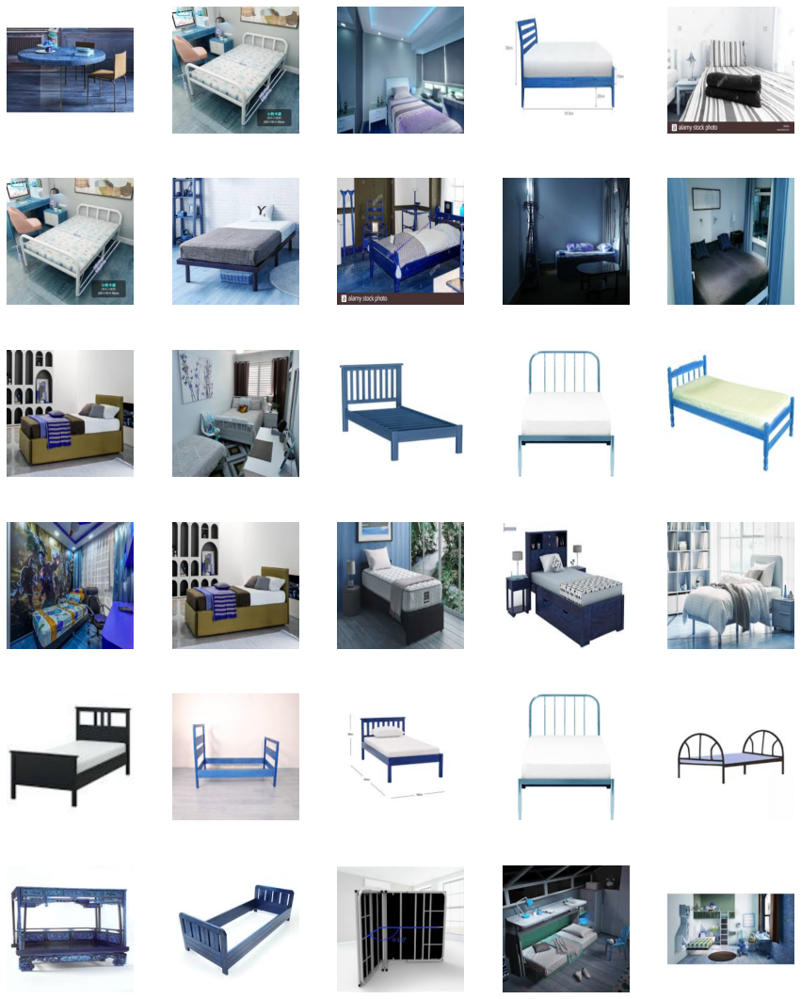

In [294]:
plt_img_df(pred_summary_m5.tail(30),(15,20));

Possible reasons why the model is not able to predict these images correctly:

    1.The model isn't able to correctly identify and learn what round tables look like, 
    hence most of the tables that are not classified correctly are round tables. 

    2.They contain both items from both catergories. (or items that look similiar)

    3.Many of bed images are actually the frames of beds, and are mistaken as tables. 


## Transfer Learning Model without Data Augmentation 

In [ ]:
# from keras.models import Models
model = VGG16()

In [ ]:
vgg = tf.keras.applications .vgg16.VGG16(include_top=False,
                                         weights='imagenet',
                                         input_shape=(224,224,3))

output = vgg.layers[-1].output
output = tf.keras.layers.Flatten()(output)
vgg_model = tf.keras.Model(vgg.input, output)

vgg_model.trainable = False

In [ ]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
cnn_model_8=Sequential()
cnn_model_8.add(vgg_model)
cnn_model_8.add(Dense(512, activation='relu', input_dim=(224,224,3)))
cnn_model_8.add(Dropout(0.5))
cnn_model_8.add(Dense(2, activation='sigmoid'))

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
cnn_model_8.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  metrics=['accuracy'])


In [ ]:
history_8=cnn_model_8.fit(X_train_array, y_train,batch_size=64,
                      validation_data=(X_val_array,y_val),
                      epochs=100, verbose=1)

Epoch 1/100
26/26 [==============================] - 3s 118ms/step - loss: 0.8281 - accuracy: 0.7901 - val_loss: 0.1396 - val_accuracy: 0.9550
Epoch 2/100
26/26 [==============================] - 3s 104ms/step - loss: 0.1257 - accuracy: 0.9620 - val_loss: 0.1136 - val_accuracy: 0.9634
Epoch 3/100
26/26 [==============================] - 3s 104ms/step - loss: 0.0747 - accuracy: 0.9795 - val_loss: 0.0911 - val_accuracy: 0.9691
Epoch 4/100
26/26 [==============================] - 3s 103ms/step - loss: 0.0511 - accuracy: 0.9879 - val_loss: 0.1058 - val_accuracy: 0.9620
Epoch 5/100
26/26 [==============================] - 3s 104ms/step - loss: 0.0322 - accuracy: 0.9958 - val_loss: 0.0857 - val_accuracy: 0.9761
Epoch 6/100
26/26 [==============================] - 3s 104ms/step - loss: 0.0221 - accuracy: 0.9982 - val_loss: 0.0938 - val_accuracy: 0.9691
Epoch 7/100
26/26 [==============================] - 3s 104ms/step - loss: 0.0133 - accuracy: 1.0000 - val_loss: 0.0838 - val_accuracy: 0.9789

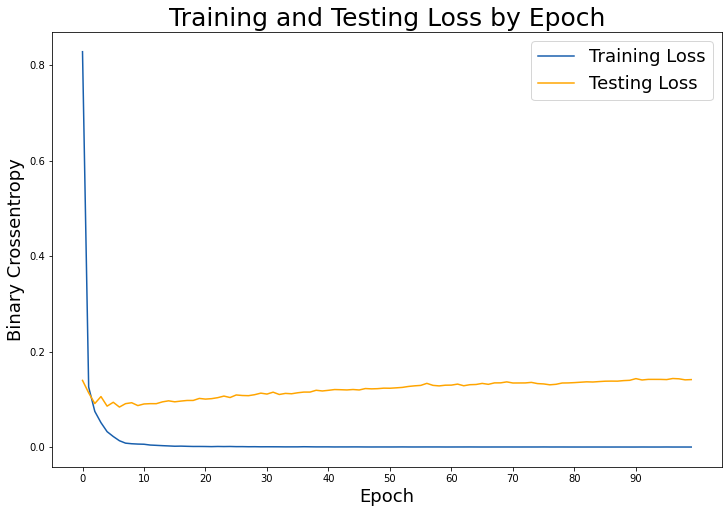

In [ ]:
train_test_loss_plt(history_8,100,10)

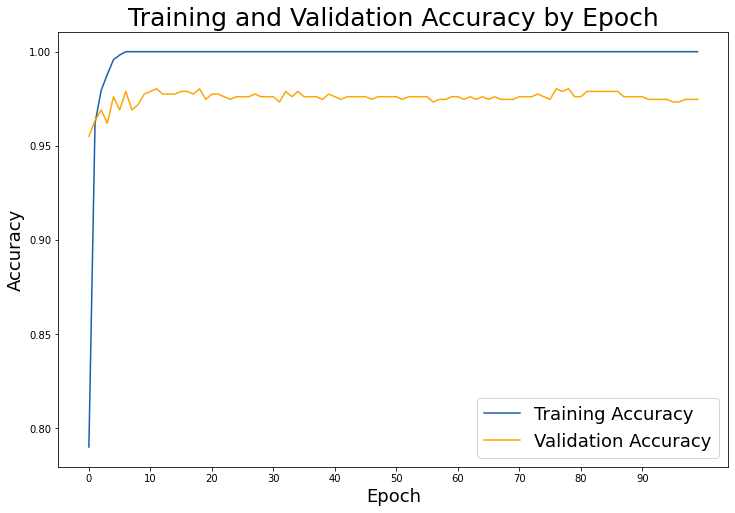

In [ ]:
acc_plt(history_8,100,10)


Both accuracy and loss plots start to converge at around 20 epoch, reaching a train loss of about 0, validation loss of about 0.14, training accuracy of about 1 and validation accuracy of about 0.97.

This shows that there is a slight overfit in the model as it is able to predict the train dataset better then the validation dataset. 

In [ ]:
cnn_8_preds= cnn_model_8.predict(X_val_array)
cnn_8_preds = cnn_8_preds.argmax(axis=-1)

Confusion matrix, without normalization


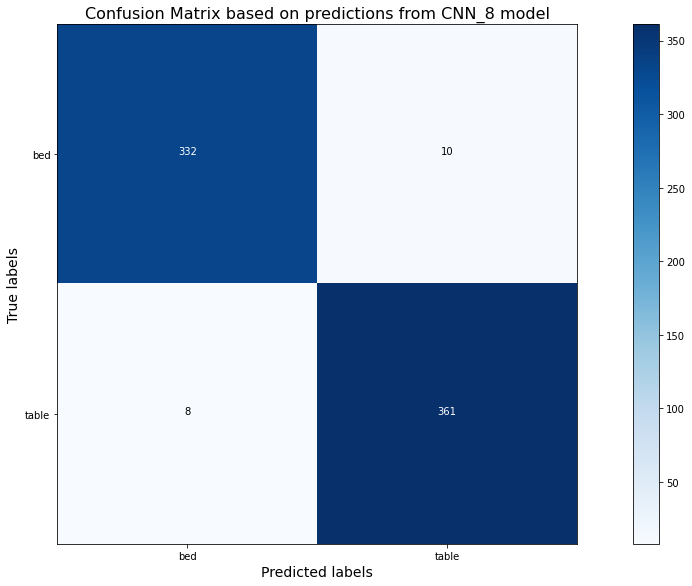

In [ ]:
cm_8 = confusion_matrix(val_labels_list, cnn_8_preds)

plot_confusion_matrix(cm_8, cm_plot_labels, normalize=False,
                      title="Confusion Matrix based on predictions from CNN_8 model")

In [ ]:
print("MODEL: TRANSFER LEARNING WITHOUT DATA AUGMENTATION SCORES")
print("--------------"*4)
cm_cal_full(cm_8)

MODEL: TRANSFER LEARNING WITHOUT DATA AUGMENTATION SCORES
--------------------------------------------------------
Accuracy:0.9747
Specificity: 0.9708
Sensitivity: 0.9783
Precision:0.973


The model is able to predict both bed and tables with almost the same accuracy, as seen by specificity score(0.97) and sensitivity score(0.97). 

In [ ]:
pred_df_m8=pd.DataFrame(y_val_cm)
pred_df_m8["prediction"]=cnn_8_preds
pred_df_m8["img"]=X_val["img"]

In [ ]:
pred_df_m8.head(10)

,class,prediction,img
405,0,0,"[[[0.9843137254901959, 0.9725490196078432, 0.9..."
922,0,0,"[[[0.7810481944718484, 0.7654056481229798, 0.7..."
659,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
751,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
311,0,0,"[[[0.34509803921568627, 0.40784313725490196, 0..."
69,0,0,"[[[1.0000000298023224, 1.0000000298023224, 1.0..."
690,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
741,0,0,"[[[1.000000026077032, 1.000000026077032, 1.000..."
806,1,1,"[[[0.7118259803921569, 0.8735294117647059, 0.9..."
1072,1,1,"[[[0.7647233829930837, 0.7490371082130136, 0.6..."


In [ ]:
pred_summary_m8=pred_df_m8.loc[pred_df_m8['class']!=pred_df_m8['prediction'],:].sort_values("class",ascending=False)[['class','prediction','img']]
pred_summary_m8

,class,prediction,img
345,1,0,"[[[0.8313463028381125, 0.8313463028381125, 0.8..."
747,1,0,"[[[0.6627538629598281, 0.7294205307751259, 0.7..."
316,1,0,"[[[0.1647234117335378, 0.21962537346378308, 0...."
216,1,0,"[[[0.24966736319018343, 0.2653536374662437, 0...."
367,1,0,"[[[0.2252450980392157, 0.21740196078431373, 0...."
977,1,0,"[[[0.17739846040220822, 0.259751402192256, 0.2..."
1198,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
1204,1,0,"[[[0.7019607964081361, 0.7254902085782413, 0.7..."
971,0,1,"[[[0.5494047659869289, 0.7376400615070381, 0.8..."
160,0,1,"[[[0.1262605081586277, 0.12233893941430485, 0...."


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


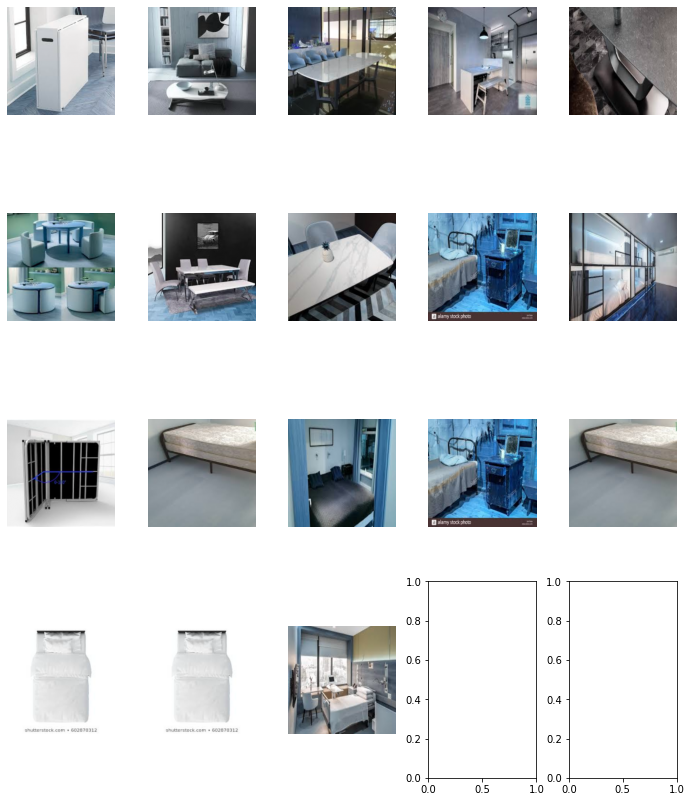

In [ ]:
plt_img_df(pred_summary_m8.head(60),(12,15));

Possible reasons why the model is not able to predict these images correctly:

    1.They do not show the entire item. (a portion of the item is out of the image)

    2.They look too different from what the conventional table or bed looks like.

    3.They are from angles that are rarely seen.

With transfer learning, the model is able to understand and classify round and bedframes well.

## Transfer Learning Model with Data Augmentation 



In [123]:
# importing VGG16()
model = VGG16()

553467904/553467096 [==============================] - 8s 0us/step


In [124]:

vgg = tf.keras.applications .vgg16.VGG16(include_top=False,
                                         weights='imagenet',
                                         input_shape=(224,224,3))

output = vgg.layers[-1].output
output = tf.keras.layers.Flatten()(output)
vgg_model = tf.keras.Model(vgg.input, output)

vgg_model.trainable = False


58892288/58889256 [==============================] - 1s 0us/step


In [125]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [199]:
cnn_model_9=Sequential()
cnn_model_9.add(vgg_model)
cnn_model_9.add(Dense(512, activation='relu', input_dim=(224,224,3)))
cnn_model_9.add(Dropout(0.5))
cnn_model_9.add(Dense(2, activation='sigmoid'))

cnn_model_9.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  metrics=['accuracy'])


In [200]:
cnn_model_9.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
functional_3 (Functional)    (None, 25088)             14714688  
_________________________________________________________________
dense_24 (Dense)             (None, 512)               12845568  
_________________________________________________________________
dropout_22 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_25 (Dense)             (None, 2)                 1026      
Total params: 27,561,282
Trainable params: 12,846,594
Non-trainable params: 14,714,688
_________________________________________________________________


In [201]:
history_9=cnn_model_9.fit(datagen.flow(X_train_array, y_train, batch_size=64),
          steps_per_epoch=len(X_train_array) / 64, epochs=100,validation_data=(X_val_array,y_val))

Epoch 1/100
26/25 [==============================] - 17s 662ms/step - loss: 1.1536 - accuracy: 0.7340 - val_loss: 0.1972 - val_accuracy: 0.9212
Epoch 2/100
26/25 [==============================] - 17s 653ms/step - loss: 0.3328 - accuracy: 0.8577 - val_loss: 0.1687 - val_accuracy: 0.9480
Epoch 3/100
26/25 [==============================] - 17s 640ms/step - loss: 0.2895 - accuracy: 0.8691 - val_loss: 0.1515 - val_accuracy: 0.9339
Epoch 4/100
26/25 [==============================] - 17s 635ms/step - loss: 0.2758 - accuracy: 0.8842 - val_loss: 0.1259 - val_accuracy: 0.9522
Epoch 5/100
26/25 [==============================] - 17s 645ms/step - loss: 0.2742 - accuracy: 0.8866 - val_loss: 0.1276 - val_accuracy: 0.9536
Epoch 6/100
26/25 [==============================] - 17s 642ms/step - loss: 0.2397 - accuracy: 0.8981 - val_loss: 0.1139 - val_accuracy: 0.9606
Epoch 7/100
26/25 [==============================] - 17s 637ms/step - loss: 0.2265 - accuracy: 0.9107 - val_loss: 0.1216 - val_accuracy:

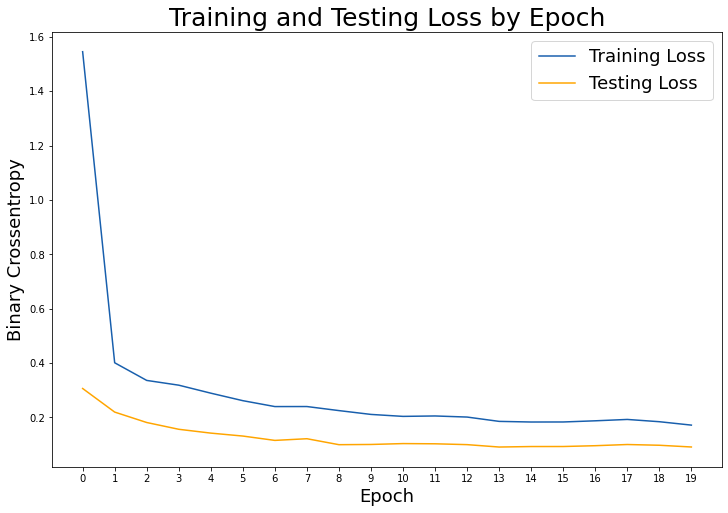

In [128]:
train_test_loss_plt(history_9,20,1)

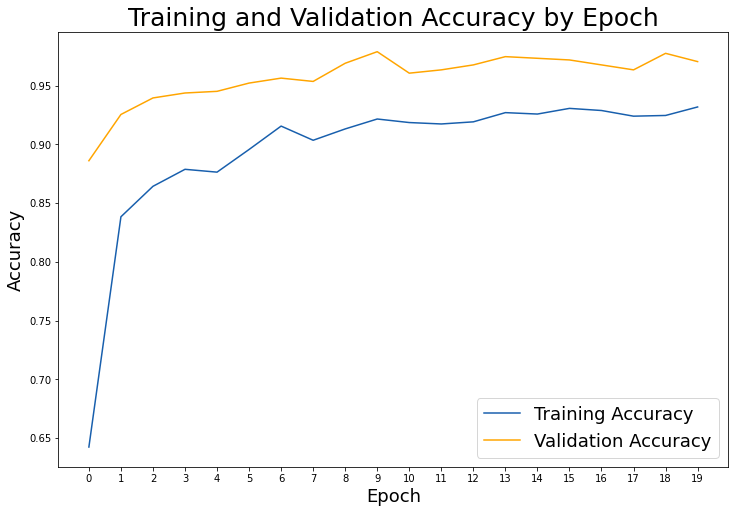

In [129]:
acc_plt(history_9,20,1)


Both accuracy and loss plots start to converge at around 20 epoch, reaching a train loss of about 0.14, validation loss of about 0.08, training accuracy of about 0.94 and validation accuracy of about 0.98.

This shows that there is a slight underfit in the model as it is able to predict the validation dataset better then the training dataset. 

In [205]:
cnn_9_preds= cnn_model_9.predict(X_val_array)
cnn_9_preds = cnn_9_preds.argmax(axis=-1)

In [207]:
val_labels_list = list(y_val_cm)

Confusion matrix, without normalization


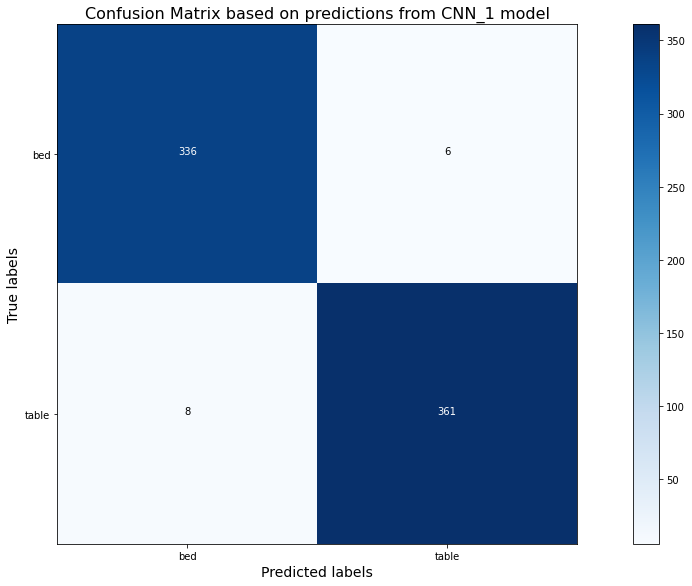

In [257]:
#creating and ploting Confusion Matrix
cm_9 = confusion_matrix(val_labels_list, cnn_9_preds)

plot_confusion_matrix(cm_9, cm_plot_labels, normalize=False,
                      title="Confusion Matrix based on predictions from CNN_1 model")

In [261]:
print("MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES")
print("--------------"*4)
cm_cal_full(cm_9)

MODEL: TRANSFER LEARNING WITH DATA AUGMENTATION SCORES
--------------------------------------------------------
Accuracy:0.9803
Specificity: 0.9825
Sensitivity: 0.9783
Precision:0.9837


Data Augmentation increase the models ability to predict beds better by 1%. Hence, data augmentation with transfer learning for the way this model is set up, makes no significant difference. 

In [232]:
pred_df_m9=pd.DataFrame(y_val_cm)
pred_df_m9["prediction"]=cnn_9_preds
pred_df_m9["img"]=X_val["img"]
pred_df_m9.head(10)

,class,prediction,img
405,0,0,"[[[0.9843137254901959, 0.9725490196078432, 0.9..."
922,0,0,"[[[0.7810481944718484, 0.7654056481229798, 0.7..."
659,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
751,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
311,0,0,"[[[0.34509803921568627, 0.40784313725490196, 0..."
69,0,0,"[[[1.0000000298023224, 1.0000000298023224, 1.0..."
690,1,1,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
741,0,0,"[[[1.000000026077032, 1.000000026077032, 1.000..."
806,1,1,"[[[0.7118259803921569, 0.8735294117647059, 0.9..."
1072,1,1,"[[[0.7647233829930837, 0.7490371082130136, 0.6..."


In [213]:
#Filtering out all the wrongly predicted images
pred_summary_m9=pred_df_m9.loc[pred_df_m9['class']!=pred_df_m9['prediction'],:].sort_values("class",ascending=False)[['class','prediction','img']]
pred_summary_m9

,class,prediction,img
19,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
331,1,0,"[[[0.47447479808965076, 0.5097689163448085, 0...."
345,1,0,"[[[0.8313463028381125, 0.8313463028381125, 0.8..."
1198,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
1204,1,0,"[[[0.7019607964081361, 0.7254902085782413, 0.7..."
821,1,0,"[[[1.0000000172294676, 1.0000000172294676, 1.0..."
747,1,0,"[[[0.6627538629598281, 0.7294205307751259, 0.7..."
366,1,0,"[[[0.9176470746340997, 0.9176470746340997, 0.9..."
57,0,1,"[[[0.7294117701404235, 0.7490196134237682, 0.7..."
242,0,1,"[[[0.5494047659869289, 0.7376400615070381, 0.8..."


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


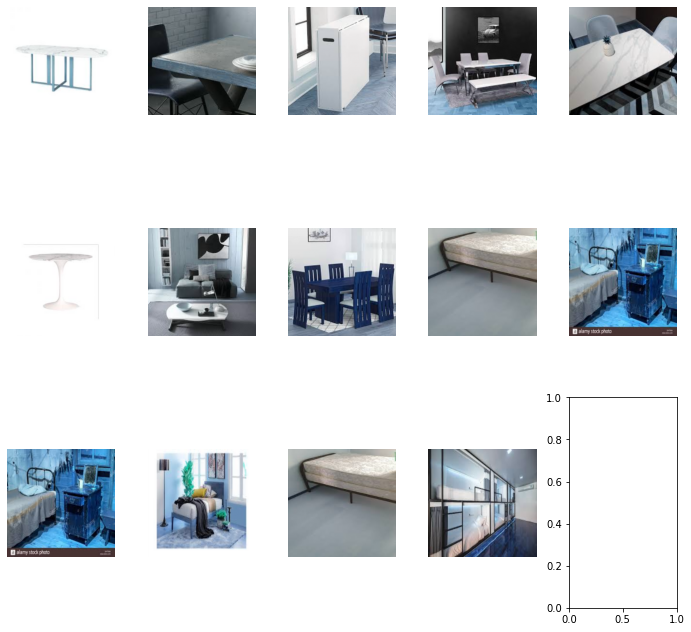

In [389]:
#ploting out wrongly predicted images
plt_img_df(pred_summary_m9.head(30),(12,12));

Possible reasons why the model is not able to predict these images correctly:

      1.They do not show the entire item. (a portion of the item is out of the image)

      2.They contain both items from both catergories. (or items that look similiar) 

      3.They look too different from what the conventional table or bed looks like. 

In [262]:
#Saving the entire model 
cnn_model_9.save("cnn_9.h5")

In [204]:
#Saving the weights of the model 
cnn_model_9.save_weights("cnn_9_weights.h5",save_format="h5")

# Transfer Learning Model Image Examples

Code in This Section Referenced from https://towardsdatascience.com/visualising-filters-and-feature-maps-for-deep-learning-d814e13bd671

In [7]:
#loading model 
model = VGG16()

553467904/553467096 [==============================] - 20s 0us/step


In [39]:
VGG16().summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [8]:
#creating a dictionary of all the layers and its names
layer_dict = dict([(layer.name, layer) for layer in model.layers])

In [41]:
for key,item in layer_dict.items():
    print(key)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten
fc1
fc2
predictions


In [89]:
#identifying which layer to be shown 
layer_name_1 = 'block2_conv2'
layer_name_2 = 'block3_conv2'

In [90]:
#assigning the output of the model to layer_name
model_1= Model(inputs=model.inputs, outputs=layer_dict[layer_name_1].output)
model_2= Model(inputs=model.inputs, outputs=layer_dict[layer_name_2].output)

In [91]:
#loading and preparing image to be fed into the model
img=mpimg.imread('../data/Table/table305.jpg') # displays better images
image = load_img('../data/Table/table305.jpg', target_size=(224, 224))
image_arr = img_to_array(image)
image_array_dim = np.expand_dims(image_arr, axis=0)
image_final = preprocess_input(image_array_dim)


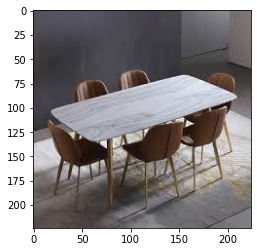

In [92]:
plt.imshow(img)

In [93]:
#Using model to predict image 
feature_maps_1 = model_1.predict(image_final)
feature_maps_2 = model_2.predict(image_final)

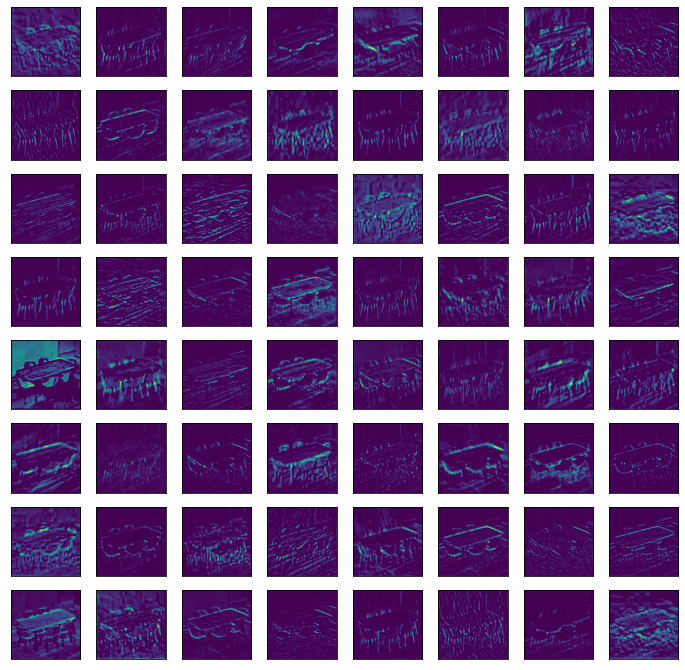

In [94]:
#displaying block2_conv2 layer from VGG16 identified above
square = 8
index = 1
plt.figure(figsize=(12,12))
for _ in range(square):
    for _ in range(square):
        
        ax = plt.subplot(square, square, index)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps_1[0, :, :, index-1], cmap='viridis')
        index += 1
        
plt.show()

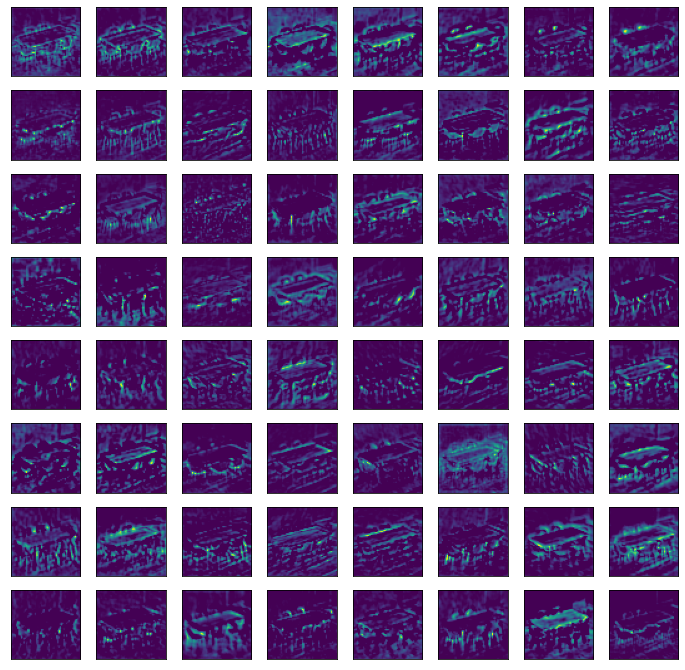

In [95]:
#displaying block3_conv2 layer from VGG16 identified above
square = 8
index = 1
plt.figure(figsize=(12,12))
for _ in range(square):
    for _ in range(square):
        
        ax = plt.subplot(square, square, index)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(feature_maps_2[0, :, :, index-1], cmap='viridis')
        index += 1
        
plt.show()

# COMMENTS
The images shown are the different layers of the VGG16 CNN model, block2_conv2 and block3_conv2 to be exact. We can see that as the layers get deeper and further into the model, the images get more abstract and get harder for us to understand. 

Another interesting point that can be seen from the model is that there are some filters that are highlighting the chairs and environment, which may mean that the model learns that multiple chairs around might be a feature that is associated with tables.

# Model Evaluation


In [231]:
print("MODEL 9: Transfer Learning with Data Augmentation")
print(cm_cal_full(cm_9))
print("--------------------------"*3)
print("MODEL 8: Transfer Learning without Data Augmentation")
print(cm_cal_full(cm_8))
print("--------------------------"*3)
print("MODEL 7: CNN model without Data Augmentation")
print(cm_cal_full(cm_7))
print("--------------------------"*3)
print("MODEL 5: CNN model with Data Augmentation")
print(cm_cal_full(cm_5))


MODEL 9: Transfer Learning with Data Augmentation
Accuracy:0.9803
Specificity: 0.9825
Sensitivity: 0.9783
Precision:0.9837
None
------------------------------------------------------------------------------
MODEL 8: Transfer Learning without Data Augmentation
Accuracy:0.9747
Specificity: 0.9708
Sensitivity: 0.9783
Precision:0.973
None
------------------------------------------------------------------------------
MODEL 7: CNN model without Data Augmentation
Accuracy:0.8228
Specificity: 0.8392
Sensitivity: 0.8076
Precision:0.8442
None
------------------------------------------------------------------------------
MODEL 5: CNN model with Data Augmentation
Accuracy:0.789
Specificity: 0.9152
Sensitivity: 0.6721
Precision:0.8953
None


As predicted, the models with transfer learning performs the best amongst all the model with the highest validation accuracy score of 97% - 98%. Data Augmentation does don't affect the models with transfer learning as the weights have been frozen, hence even with the additional data input, the model is not learning.

From this we can also tell that Data augmentation is not needed in this with the CNN models that have been made from scratch as it actually decreases the overall accuracy(82% to 78%) and sensitivity(80% to 67%) scores but increases the Specificity(83% to 91%) and Precision scores(84% to 89%). This means that with data augmentation the model is better able to predict tables as compared to beds.

With this, the model 9(transfer learning with data augmentation) is the best performer and will be used to predict real life test postings that have been taken from Carousell's website as a form of deployment of the model.


# Model Predictions on Real Posts

The goal in this section is to prove the deployability of using a CNN image classifier to tackle the problem statement of having over exposed listings. Images of real listings from both categories of tables and beds have been chosen as the proof of concept to test out the CNN model with transfer learning. Images chosen have been selected to represent the vast differences found in listings(with and without background and photos that don’t show the entire item)

Main Workflow:

    1.Import weights 
    2.Importing images
    3.Creating a dataframe
    4.Reading, resizing and re-scaling of images
    5.Reformatting numpy array formats
    6.Predicting using imported model weights 


In [5]:
#loading saved best model
#model_9=load_model("/content/cnn_9.h5")
model_9=load_model("../data/weights/cnn_9.h5")

In [406]:
#Creating a list of paths of each image

#realpost_table_path=glob.glob('/content/drive/My Drive/data/REAL_POSTS_table/*.jpg')
#realpost_bed_path=glob.glob('/content/drive/My Drive/data/REAL_POST_bed/*.jpg')

realpost_table_path=glob.glob('../data/REAL_POSTS_table/*.jpg')
realpost_bede_path=glob.glob('../data/REAL_POST_bed/*.jpg')

print(realpost_table_path)
print(realpost_bed_path)


['/content/drive/My Drive/data/REAL_POSTS_table/table3.jpg', '/content/drive/My Drive/data/REAL_POSTS_table/table2.jpg', '/content/drive/My Drive/data/REAL_POSTS_table/table1.jpg']
['/content/drive/My Drive/data/REAL_POST_bed/bed3.jpg', '/content/drive/My Drive/data/REAL_POST_bed/bed2.jpg', '/content/drive/My Drive/data/REAL_POST_bed/bed1.jpg']


In [407]:
#changing into dataframe
post_table_df=pd.DataFrame(realpost_table_path,columns=["filename"])
post_bed_df=pd.DataFrame(realpost_bed_path,columns=["filename"])
#adding class column
post_bed_df["class"]=0
post_table_df["class"]=1

In [408]:
post_table_df

,filename,class
0,/content/drive/My Drive/data/REAL_POSTS_table/...,1
1,/content/drive/My Drive/data/REAL_POSTS_table/...,1
2,/content/drive/My Drive/data/REAL_POSTS_table/...,1


In [409]:
post_bed_df

,filename,class
0,/content/drive/My Drive/data/REAL_POST_bed/bed...,0
1,/content/drive/My Drive/data/REAL_POST_bed/bed...,0
2,/content/drive/My Drive/data/REAL_POST_bed/bed...,0


In [410]:
#combining both table and bed dataframes
post_df= pd.concat([post_table_df,post_bed_df])
post_df.head()

,filename,class
0,/content/drive/My Drive/data/REAL_POSTS_table/...,1
1,/content/drive/My Drive/data/REAL_POSTS_table/...,1
2,/content/drive/My Drive/data/REAL_POSTS_table/...,1
0,/content/drive/My Drive/data/REAL_POST_bed/bed...,0
1,/content/drive/My Drive/data/REAL_POST_bed/bed...,0


In [421]:
def img_to_arr(path):
  '''Function that loads image from its path, resizes and coverts it into an array'''
  img=image.load_img(path,target_size=(224,224))
  x= image.img_to_array(img)
  return x


In [415]:
#creating new column with scaled arrays to allow the image to be shown 
post_df["img"]=post_df["filename"].apply(lambda x: img_to_arr(x)/255)
#creating new column with the right shape to allow it to be predicted 
post_df["img_for_pred"]=post_df["filename"].apply(lambda x: np.expand_dims(img_to_arr(x),axis=0))

In [416]:
post_df

,filename,class,img,img_for_pred
0,/content/drive/My Drive/data/REAL_POSTS_table/...,1,"[[[0.6431373, 0.6039216, 0.6], [0.6431373, 0.6...","[[[[164. 154. 153.], [164. 154. 153.], [165. 1..."
1,/content/drive/My Drive/data/REAL_POSTS_table/...,1,"[[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [1.0, 1.0,...","[[[[255. 255. 255.], [255. 255. 255.], [255. 2..."
2,/content/drive/My Drive/data/REAL_POSTS_table/...,1,"[[[0.3647059, 0.6, 0.7019608], [0.17254902, 0....","[[[[ 93. 153. 179.], [ 44. 80. 102.], [ 8. 14..."
0,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,"[[[0.4745098, 0.43529412, 0.4], [0.4745098, 0....","[[[[121. 111. 102.], [121. 111. 102.], [121. 1..."
1,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,"[[[0.85882354, 0.7882353, 0.6392157], [0.85882...","[[[[219. 201. 163.], [219. 201. 163.], [220. 2..."
2,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,"[[[0.4392157, 0.40784314, 0.3647059], [0.43921...","[[[[112. 104. 93.], [112. 104. 93.], [112. 1..."


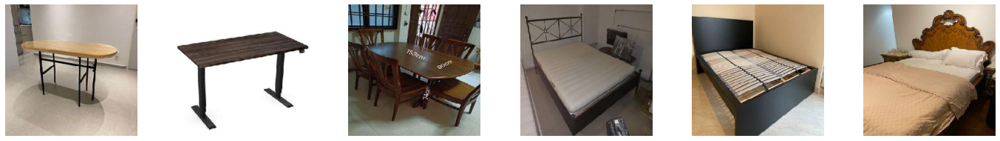

In [422]:
#ploting all the photos in the real_post DataFrame
fig, ax = plt.subplots(nrows=1,ncols=6,figsize=(24,24))
plt.gray()
ax=ax.ravel()
post_img_arr=list(post_df["img"])
plt.subplots_adjust(hspace=0.05, wspace=0.3)
for i,img in enumerate(post_img_arr):
   ax[i].imshow(img)
   ax[i].axis("off")

plt.show()

In [423]:
#predicting the classification based on the best model 
post_df["prediction"]=post_df["img_for_pred"].apply(lambda x: np.argmax(model_9.predict(x)))

In [420]:
post_df[["filename","class","prediction"]]

,filename,class,prediction
0,/content/drive/My Drive/data/REAL_POSTS_table/...,1,1
1,/content/drive/My Drive/data/REAL_POSTS_table/...,1,1
2,/content/drive/My Drive/data/REAL_POSTS_table/...,1,1
0,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,0
1,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,0
2,/content/drive/My Drive/data/REAL_POST_bed/bed...,0,0


The model was able to classify all the images correctly, even when given a bed frame, tables that are rounded, a picture that does not fully show the entire bed and with most of them having a background. Although more complex images should be chosen to test the limits of the model, that would be highly unlikely as posts on Carousell are mostly focused and clear with which item is being shown. 


# Conclusion and Reccomendation/Limitations

All models performed better than the baseline of 52%, however, the model using transfer learning with data augmentation performs the best with an accuracy score of 98.03% and has been proven that the model works on real life post from the platform itself with 100% accuracy. With this model, the team is able to successfully meet the objectives stated in the problem statement of using a CNN imgage classifier model as a pilot test to prove that it is indeed possible to develop a model that is able to classify items with great accuracy.

Transfer learning can continue to be applied to item categories that are easier to differentiate such as furniture, however, with more intricate items like electronics, a custom model with data augmentation might be able to classify such items. The Data team can also tap into the 57 million items posted and use that in conjunction with widely available resources to build a model to help a more robust and accurate CNN image classifier model.

There are multiple limitations of this project, this would particularly affect the models that are built from scratch. Due to the method used to scrape google images, there are some random photos that are not related to the item category at all that was found in the datasets. Another limitation was having duplicates of the same photo, and the limited photos available on google.
